In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from tensorflow.keras.utils import image_dataset_from_directory
import tensorflow as tf
from tensorflow.keras import callbacks
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator

BATCH_SIZE = 32
IMAGE_HEIGHT = 256
IMAGE_WIDTH = 256
NUM_CLASSES = 2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
TRAIN_PATH = '/content/drive/MyDrive/DFU/Patches'
TEST_PATH = '/content/drive/MyDrive/DFU/TestSet'

(224, 224, 3)


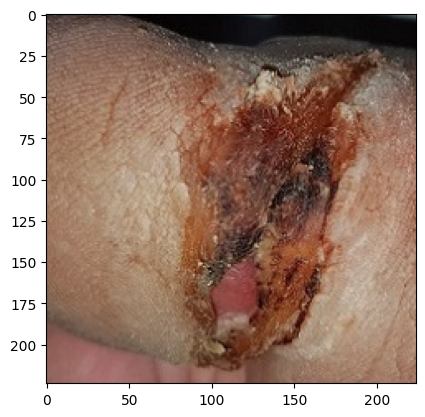

In [ ]:
fpath=TRAIN_PATH+r'/Abnormal(Ulcer)/10.jpg'
img=plt.imread(fpath)
print (img.shape)
imshow(img)

In [ ]:

# Load the Training and Validation Dataset
train_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_WIDTH, IMAGE_HEIGHT),
    subset = 'training',
    seed = 0,
    label_mode='categorical'
)

validation_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_WIDTH, IMAGE_HEIGHT),
    subset = 'validation',
    seed = 0,
    label_mode='categorical'
)

Found 1060 files belonging to 2 classes.
Using 848 files for training.
Found 1060 files belonging to 2 classes.
Using 212 files for validation.


In [ ]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>

In [ ]:
# Load Test Dataset
def decode_img(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size
  return tf.image.resize(img, [IMAGE_HEIGHT, IMAGE_WIDTH])

def process_path(file_path):
  # Load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img

test_ds = tf.data.Dataset.list_files(str(TEST_PATH + '/*'), shuffle=False)
# test_ds = test_ds.shuffle(len(os.listdir(TEST_PATH)), reshuffle_each_iteration=False)
test_ds = test_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
# Get the class names
class_names = train_ds.class_names
print(class_names)

['Abnormal(Ulcer)', 'Normal(Healthy skin)']


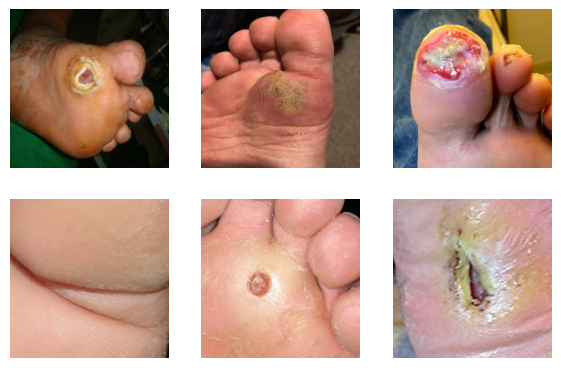

In [ ]:
# Visualize the testing dataset
plt.figure(figsize = (7, 7))

i = 0
for images in test_ds.take(6):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.axis("off")
    i += 1

In [ ]:
# Layers of Augmentation
img_augmentation = Sequential(
    [
        layers.Resizing(IMAGE_WIDTH, IMAGE_HEIGHT),
        layers.RandomRotation(factor = 0.15),
        layers.RandomTranslation(height_factor = 0.1, width_factor = 0.1),
        layers.RandomFlip(),
        layers.GaussianNoise(stddev = 0.07),
        layers.RandomContrast(factor = 0.08),
    ],
    name = "img_augmentation"
)

In [ ]:
!pip install vit-keras
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 9.6 MB/s eta 0:00:00


In [ ]:
from vit_keras import vit
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import math

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
vit_model = vit.vit_b32(
        image_size = 256,
        activation = 'softmax',
        pretrained = True,
        include_top = False,
        pretrained_top = False,
        classes = 2)

353253686/353253686 [==============================] - 3s 0us/step


/usr/local/lib/python3.10/dist-packages/vit_keras/utils.py:81: UserWarning: Resizing position embeddings from 12, 12 to 8, 8
  warnings.warn(


In [ ]:
model = tf.keras.Sequential([
        vit_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(11, activation = tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(2, 'softmax')
    ],
    name = 'vision_transformer')

model.summary()


Model: "vision_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vit-b32 (Functional)        (None, 768)               87466752  
                                                                 
 flatten (Flatten)           (None, 768)               0         
                                                                 
 batch_normalization (Batch  (None, 768)               3072      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 11)                8459      
                                                                 
 batch_normalization_1 (Bat  (None, 11)                44        
 chNormalization)                                                
                                                                 
 dense_1 (Dense)             (None, 2)          

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# early_stopping = EarlyStopping(monitor='val_loss',patience=9)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = 'model.hdf5',
                                                  monitor = 'val_accuracy',
                                                  verbose = 1,
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

def step_decay(epoch):
    initial_lrate = 0.001
    drop = 0.1
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(step_decay, verbose=1)

In [ ]:
callbacks =[checkpointer, lr_scheduler]

In [ ]:
history = model.fit(
    train_ds,
    steps_per_epoch=math.ceil(len(train_ds) / BATCH_SIZE),
    validation_data=validation_ds,
    validation_steps=math.ceil(len(validation_ds) / BATCH_SIZE),
    epochs=60,
    callbacks=callbacks
)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/60
1/1 [==============================] - ETA: 0s - loss: 1.0616 - accuracy: 0.4062
Epoch 1: val_accuracy improved from -inf to 0.59375, saving model to model.hdf5
1/1 [==============================] - 153s 153s/step - loss: 1.0616 - accuracy: 0.4062 - val_loss: 1.4168 - val_accuracy: 0.5938 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/60
1/1 [==============================] - ETA: 0s - loss: 0.6852 - accuracy: 0.5938
Epoch 2: val_accuracy did not improve from 0.59375
1/1 [==============================] - 2s 2s/step - loss: 0.6852 - accuracy: 0.5938 - val_loss: 1.6336 - val_accuracy: 0.4688 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/60
1/1 [==============================] - ETA: 0s - loss: 0.8405 - accuracy: 0.7500
Epoch 3: val_accuracy did not improve from 0.59375
1/1 [==============================] - 5s 5s/step - loss: 0.8405 - a


Epoch 28: val_accuracy did not improve from 0.84375
1/1 [==============================] - 2s 2s/step - loss: 0.0000e+00 - accuracy: 0.0000e+00 - val_loss: 0.8065 - val_accuracy: 0.5312 - lr: 1.0000e-05


In [ ]:
import numpy as np

1/1 [==============================] - 0s 51ms/step


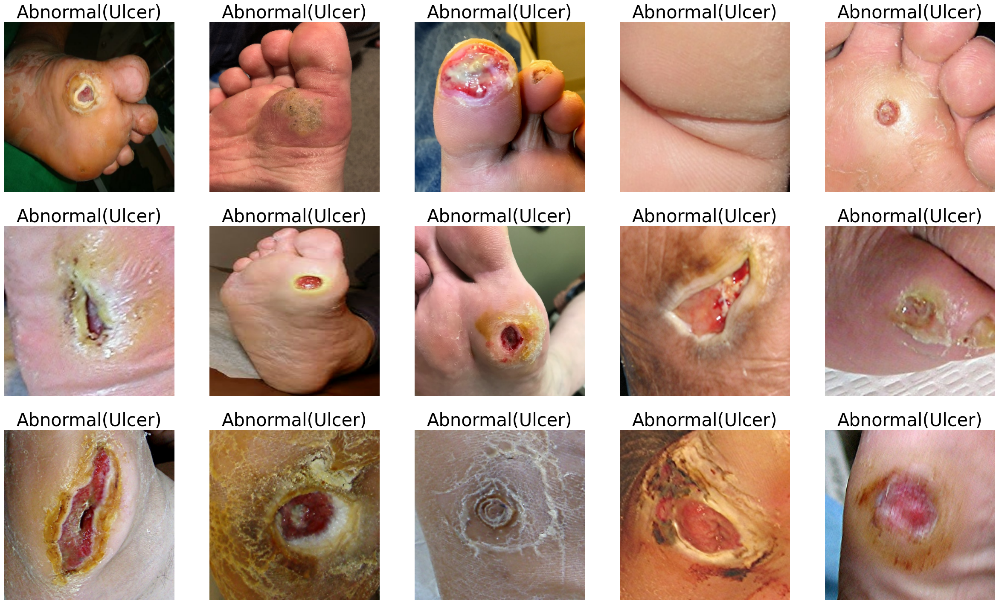

In [ ]:
# Testing on Test Set
plt.figure(figsize = (30, 30))
plt.tight_layout()

i = 0
for images in test_ds.take(15):
    ax = plt.subplot(5, 5, i + 1)
    prediction = np.argmax(model.predict(np.array([images])), axis = 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.title(class_names[prediction[0]], fontsize=30)
    plt.axis("off")

    i += 1


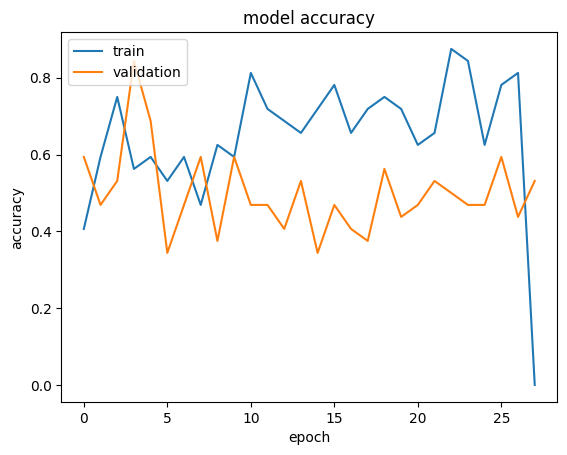

In [ ]:
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


plot_hist(history)

In [ ]:
model.save("/kaggle/working/model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten, BatchNormalization, Dense, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from vit_keras import vit
import tensorflow_addons as tfa
import math

# Load ResNet-50
resnet_model = ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3),
    pooling=None,
)

# Freeze ResNet-50 layers
for layer in resnet_model.layers:
    layer.trainable = False

# Load Vision Transformer (ViT)
vit_model = vit.vit_b32(
    image_size=256,
    activation='softmax',
    pretrained=True,
    include_top=False,
    pretrained_top=False,
    classes=2,
)

# Build the composite model
input_layer = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

resnet_features = resnet_model(input_layer)
vit_features = vit_model(input_layer)

# Adjust ViT features shape
# vit_features = GlobalAveragePooling2D()(vit_features)
# Adjust ResNet features shape
resnet_features = Flatten()(resnet_features)

merged_features = tf.keras.layers.concatenate([resnet_features, vit_features])

x = Flatten()(merged_features)
x = BatchNormalization()(x)
x = Dense(11, activation=tfa.activations.gelu)(x)
x = BatchNormalization()(x)
output_layer = Dense(2, activation='softmax')(x)

model2 = Model(inputs=input_layer, outputs=output_layer, name='resnet50_vit_model')

# Compile the model
model2.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model2.summary()


94765736/94765736 [==============================] - 0s 0us/step


/usr/local/lib/python3.10/dist-packages/vit_keras/utils.py:81: UserWarning: Resizing position embeddings from 12, 12 to 8, 8
  warnings.warn(


Model: "resnet50_vit_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 resnet50 (Functional)       (None, 8, 8, 2048)           2358771   ['input_4[0][0]']             
                                                          2                                       
                                                                                                  
 flatten_1 (Flatten)         (None, 131072)               0         ['resnet50[0][0]']            
                                                                                                  
 vit-b32 (Functional)        (None, 768)                  8746675   ['input_4[0][

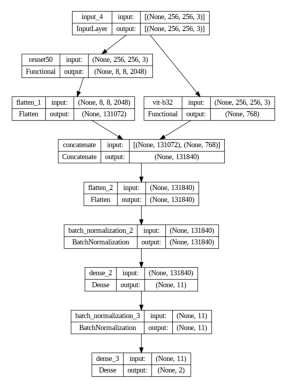

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model2, to_file='resnet50vit.png', show_shapes=True, show_layer_names=True)

# Display the saved image
image = plt.imread('resnet50vit.png')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
history = model2.fit(
    train_ds,
    steps_per_epoch=math.ceil(len(train_ds) / BATCH_SIZE),
    validation_data=validation_ds,
    validation_steps=math.ceil(len(validation_ds) / BATCH_SIZE),
    epochs=20,
    callbacks=callbacks
)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/20
1/1 [==============================] - ETA: 0s - loss: 0.8925 - accuracy: 0.5625
Epoch 1: val_accuracy did not improve from 0.84375
1/1 [==============================] - 55s 55s/step - loss: 0.8925 - accuracy: 0.5625 - val_loss: 1.5458 - val_accuracy: 0.8438 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/20
1/1 [==============================] - ETA: 0s - loss: 0.0196 - accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.84375
1/1 [==============================] - 2s 2s/step - loss: 0.0196 - accuracy: 1.0000 - val_loss: 3.6243 - val_accuracy: 0.8438 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/20
1/1 [==============================] - ETA: 0s - loss: 0.0116 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.84375 to 0.87500, saving model to model.hdf5
1/1 [==============================] - 4s 4s/step - loss: 0.0116 - 

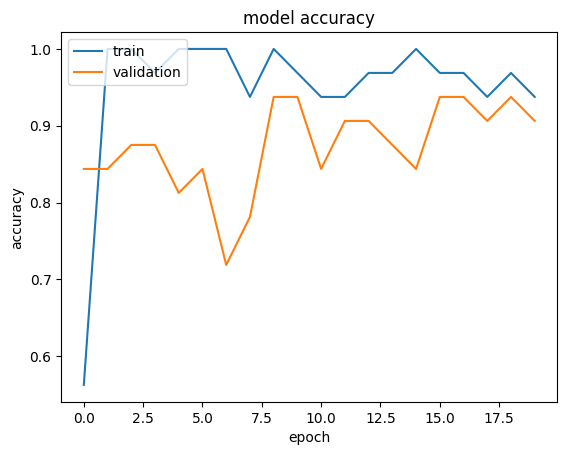

In [ ]:
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


plot_hist(history)

In [ ]:
def predict_and_evaluate(model, test_ds, class_names):
  """Predicts on the test dataset and returns predictions and true labels for evaluation."""
  predictions = []
  true_labels = []
  for images, filenames in test_ds:
    # Extract class labels from filenames (assuming consistent naming)
    labels = [os.path.basename(f.numpy().decode('utf-8')).split('(')[0] for f in filenames]
    preds = np.argmax(model.predict(images), axis=1)
    predictions.extend(preds.tolist())
    true_labels.extend(labels)
  return predictions, true_labels


In [ ]:
test_ds

<_ParallelMapDataset element_spec=TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None)>

1/1 [==============================] - 0s 62ms/step


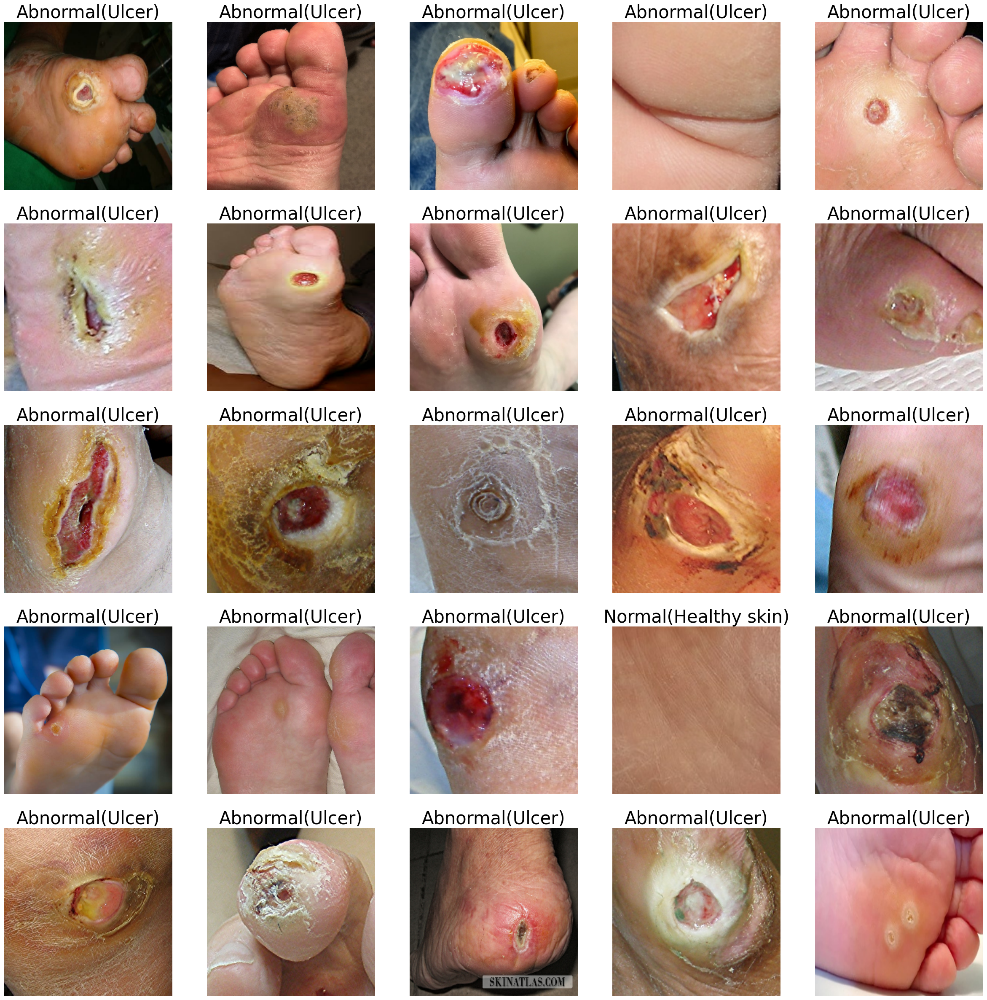

In [ ]:
# Testing on Test Set
plt.figure(figsize = (30, 30))
plt.tight_layout()

i = 0
for images in test_ds.take(25):
    ax = plt.subplot(5, 5, i + 1)
    prediction = np.argmax(model2.predict(np.array([images])), axis = 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.title(class_names[prediction[0]], fontsize=30)
    plt.axis("off")

    i += 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten, BatchNormalization, Dense, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNet
from vit_keras import vit
import tensorflow_addons as tfa
import math

# Load MobileNet
mobilenet_model = MobileNet(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3),
    pooling=None,
)

# Freeze MobileNet layers
for layer in mobilenet_model.layers:
    layer.trainable = False

# Load Vision Transformer (ViT)
vit_model = vit.vit_b32(
    image_size=256,
    activation='softmax',
    pretrained=True,
    include_top=False,
    pretrained_top=False,
    classes=2,
)

# Build the composite model
input_layer = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

mobilenet_features = mobilenet_model(input_layer)
vit_features = vit_model(input_layer)

# Adjust ViT features shape
# vit_features = GlobalAveragePooling2D()(vit_features)
# Adjust MobileNet features shape
mobilenet_features = Flatten()(mobilenet_features)

merged_features = tf.keras.layers.concatenate([mobilenet_features, vit_features])

x = Flatten()(merged_features)
x = BatchNormalization()(x)
x = Dense(11, activation=tfa.activations.gelu)(x)
x = BatchNormalization()(x)
output_layer = Dense(2, activation='softmax')(x)

model3 = Model(inputs=input_layer, outputs=output_layer, name='mobilenet_vit_model')

# Compile the model
model3.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model3.summary()


17225924/17225924 [==============================] - 0s 0us/step
Model: "mobilenet_vit_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)           3228864   ['input_7[0][0]']             
 onal)                                                                                            
                                                                                                  
 flatten_3 (Flatten)         (None, 65536)                0         ['mobilenet_1.00_224[0][0]']  
                                                                                                  
 vit-b32 (Funct

In [ ]:
history = model3.fit(
    train_ds,
    steps_per_epoch=math.ceil(len(train_ds) / BATCH_SIZE),
    validation_data=validation_ds,
    validation_steps=math.ceil(len(validation_ds) / BATCH_SIZE),
    epochs=20,
    callbacks=callbacks
)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/20
1/1 [==============================] - ETA: 0s - loss: 0.8426 - accuracy: 0.5938
Epoch 1: val_accuracy did not improve from 0.93750
1/1 [==============================] - 49s 49s/step - loss: 0.8426 - accuracy: 0.5938 - val_loss: 1.2611 - val_accuracy: 0.8750 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/20
1/1 [==============================] - ETA: 0s - loss: 0.4064 - accuracy: 0.7812
Epoch 2: val_accuracy did not improve from 0.93750
1/1 [==============================] - 1s 1s/step - loss: 0.4064 - accuracy: 0.7812 - val_loss: 2.5186 - val_accuracy: 0.8750 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/20
1/1 [==============================] - ETA: 0s - loss: 0.4548 - accuracy: 0.8125
Epoch 3: val_accuracy did not improve from 0.93750
1/1 [==============================] - 1s 1s/step - loss: 0.4548 - accuracy: 0.8125 - val_loss: 2.8

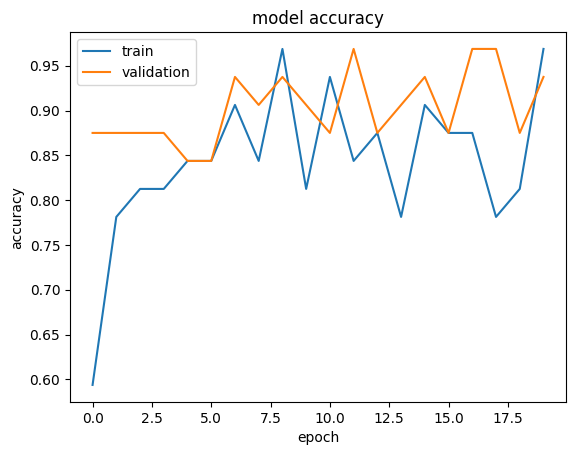

In [ ]:
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


plot_hist(history)

1/1 [==============================] - 0s 84ms/step


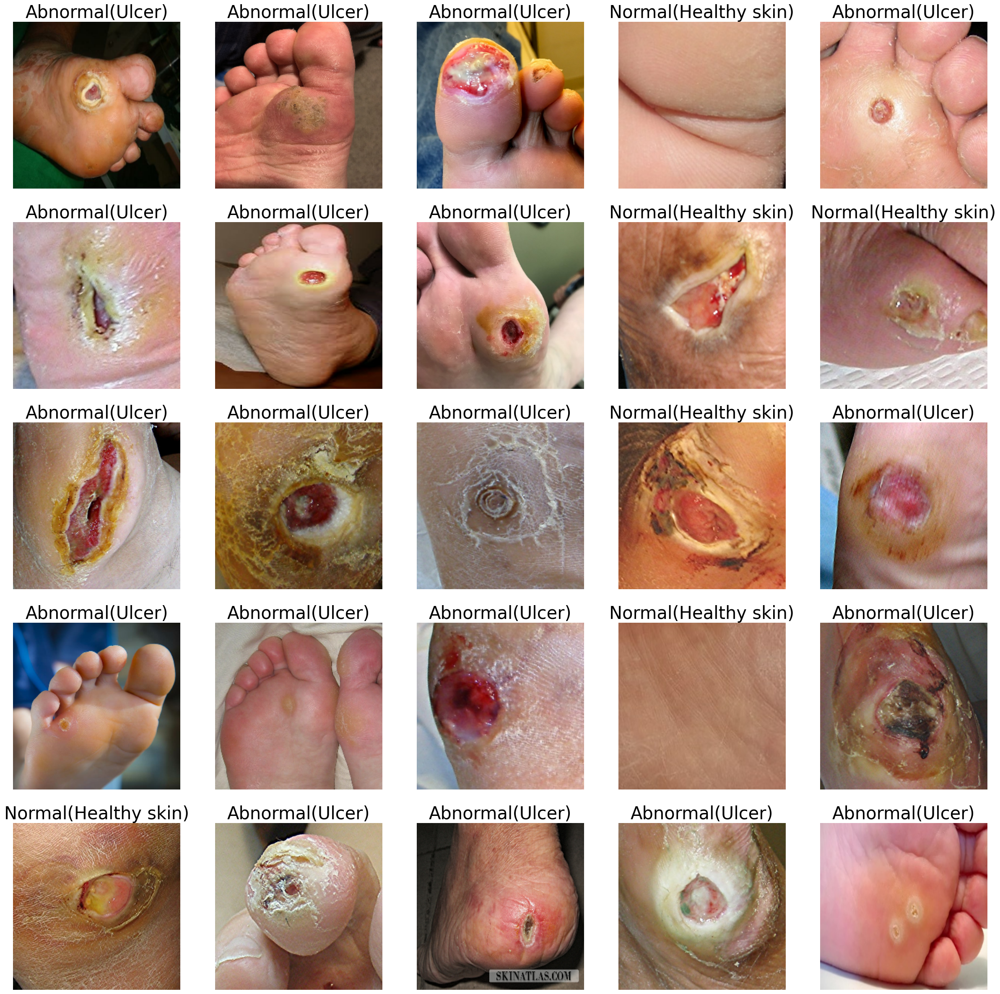

In [ ]:
# Testing on Test Set
plt.figure(figsize = (30, 30))
plt.tight_layout()

i = 0
for images in test_ds.take(25):
    ax = plt.subplot(5, 5, i + 1)
    prediction = np.argmax(model3.predict(np.array([images])), axis = 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.title(class_names[prediction[0]], fontsize=30)
    plt.axis("off")

    i += 1

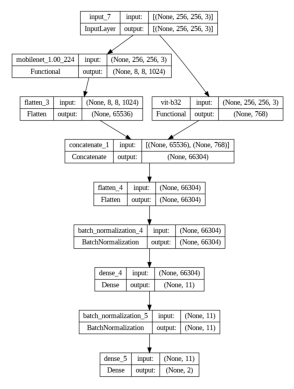

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model3, to_file='mobilenetvit.png', show_shapes=True, show_layer_names=True)

# Display the saved image
image = plt.imread('mobilenetvit.png')
plt.imshow(image)
plt.axis('off')
plt.show()